In [1]:
#Load the libraries
import pandas as pd
import matplotlib.pyplot as plt #make graphs

import numpy as np
from sklearn import linear_model
from sklearn import metrics
from sklearn.cross_validation import train_test_split

from sklearn.preprocessing import Imputer #rectify missing data
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report



import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

C:\Users\Anna\Anaconda3\lib\site-packages\sklearn\cross_validation.py:41: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)


In [4]:
otp=pd.read_csv("otp.csv")
otp.describe()
otp.head()

,Route,Departing_Port,Arriving_Port,Airline,Month,Sectors_Scheduled,Sectors_Flown,Cancellations,Departures_On_Time,Arrivals_On_Time,Departures_Delayed,Arrivals_Delayed,Year,Month_Num
0,Adelaide-Brisbane,Adelaide,Brisbane,All Airlines,37987,155.0,155,0.0,123.0,120.0,32.0,35.0,2004,1
1,Adelaide-Canberra,Adelaide,Canberra,All Airlines,37987,75.0,75,0.0,72.0,72.0,3.0,3.0,2004,1
2,Adelaide-Gold Coast,Adelaide,Gold Coast,All Airlines,37987,40.0,40,0.0,36.0,35.0,4.0,5.0,2004,1
3,Adelaide-Melbourne,Adelaide,Melbourne,All Airlines,37987,550.0,548,2.0,478.0,487.0,70.0,61.0,2004,1
4,Adelaide-Perth,Adelaide,Perth,All Airlines,37987,191.0,191,0.0,169.0,168.0,22.0,23.0,2004,1


In [75]:
#otp['Cancellations%']=otp['Cancellations']/otp['Sectors_Scheduled']
#otp['Departures_On_Time%']=otp['Departures_On_Time']/otp['Sectors_Scheduled']
#otp['Arrivals_On_Time%']=otp['Arrivals_On_Time']/otp['Sectors_Scheduled']
#otp['Departures_Delayed%']=otp['Departures_Delayed']/otp['Sectors_Scheduled']
#otp['Arrivals_Delayed%']=otp['Arrivals_Delayed']/otp['Sectors_Scheduled']

In [ ]:
#Predict Airline based on lowest percentage delays for a paticular route??

In [6]:
del otp['Month']

In [7]:
otp.dtypes

Route                  object
Departing_Port         object
Arriving_Port          object
Airline                object
Sectors_Scheduled     float64
Sectors_Flown           int64
Cancellations         float64
Departures_On_Time    float64
Arrivals_On_Time      float64
Departures_Delayed    float64
Arrivals_Delayed      float64
Year                    int64
Month_Num               int64
dtype: object

In [8]:
print(otp.isnull().sum())

Route                   0
Departing_Port          0
Arriving_Port           0
Airline                 0
Sectors_Scheduled       0
Sectors_Flown           0
Cancellations         316
Departures_On_Time      0
Arrivals_On_Time        0
Departures_Delayed      5
Arrivals_Delayed        0
Year                    0
Month_Num               0
dtype: int64


In [10]:
otp.fillna(otp.mean(), inplace=True)
# count the number of NaN values in each column
print(otp.isnull().sum())

KeyboardInterrupt: 

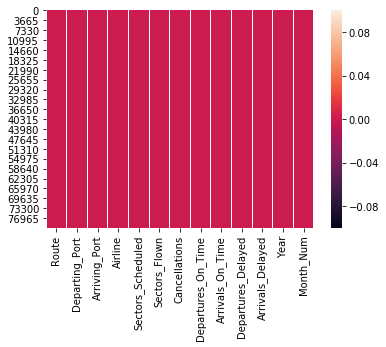

In [11]:
sns.heatmap(otp.isnull())


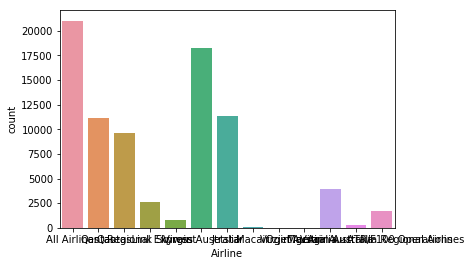

In [12]:
sns.countplot(x='Airline',data=otp)


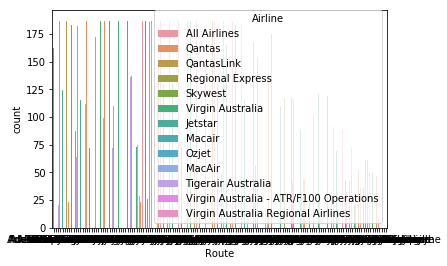

In [13]:
sns.countplot(x='Route',hue='Airline',data=otp)


In [14]:
otp = pd.get_dummies(otp, columns=['Route'], drop_first=True)
otp = pd.get_dummies(otp, columns=['Departing_Port'], drop_first=True)
otp = pd.get_dummies(otp, columns=['Arriving_Port'], drop_first=True)

shape = otp.shape

In [ ]:
#del otp['Route']



In [15]:
X_train, X_test, y_train, y_test = train_test_split(otp.drop('Airline',axis=1), 
                                                    otp['Airline'], test_size=0.30, 
                                                    random_state=101)


In [17]:
logmodel = LogisticRegression()
logmodel.fit(X_train,y_train)
predictions = logmodel.predict(X_test)

In [18]:
print(classification_report(y_test,predictions))
# The f1-score gives you the harmonic mean of precision and recall. 
#The scores corresponding to every class will tell you the accuracy of the 
#classifier in classifying the data points in that particular class compared 
#to all other classes.
#The support is the number of samples of the true response that lie in that 
#class.
#The last line gives a weighted average of precision, recall and f1-score 
#where the weights are the support values. so for precision the avg is 



                                        precision    recall  f1-score   support

                          All Airlines       0.31      0.52      0.39      6260
                               Jetstar       0.36      0.36      0.36      3322
                                MacAir       0.00      0.00      0.00         2
                                Macair       0.67      0.18      0.29        11
                                 Ozjet       0.00      0.00      0.00         1
                                Qantas       0.31      0.09      0.14      3322
                            QantasLink       0.33      0.25      0.28      2943
                      Regional Express       0.31      0.56      0.40       724
                               Skywest       0.00      0.00      0.00       219
                    Tigerair Australia       0.49      0.41      0.45      1246
                      Virgin Australia       0.31      0.26      0.28      5556
Virgin Australia - ATR/F100 Operations 

C:\Users\Anna\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


In [ ]:
#  logistic regression requires there to be little or no multicollinearity among the independent variables.  This means that the independent variables should not be too highly correlated with each other.
#logistic regression assumes linearity of independent variables and log odds.  
#although this analysis does not require the dependent and independent variables
#to be related linearly, it requires that the independent variables are 
#linearly related to the log odds.

In [92]:
rs = np.random.RandomState(0)
corr = otp.corr()
corr.style.background_gradient(cmap='coolwarm')